# Homework 3 

# Задача №1 - Лес или пустыня?

Часто при анализе изображений местности необходимо понять ее характер. В частности, если определить, что на изображении преобладет вода, то имеет смысл искать корабли на таком изображении. Если на картинке густой лес, то, возможно, это не лучшая зона для посадки дрона или беспилотника.

Ваша задача - написать программу, которая будет отличать лес от пустыни. В приложении можно найти реальные спутниковые снимки лесов и пустынь.

Примеры изображений:
<table><tr>
    <td> <img src="https://i.ibb.co/nmHHctW/test_image_00.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/dM77C4b/test_image_06.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [60]:
 
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [6]:
# function of 1 lr
def plot_one_image(image: np.ndarray, title=None) -> None:
    """
    """
    fig, axs = plt.subplots(1, 1, figsize=(8, 7))
    
    axs.imshow(image)
    axs.axis('off')
    if title:
        axs.set_title(title)
    plt.plot()

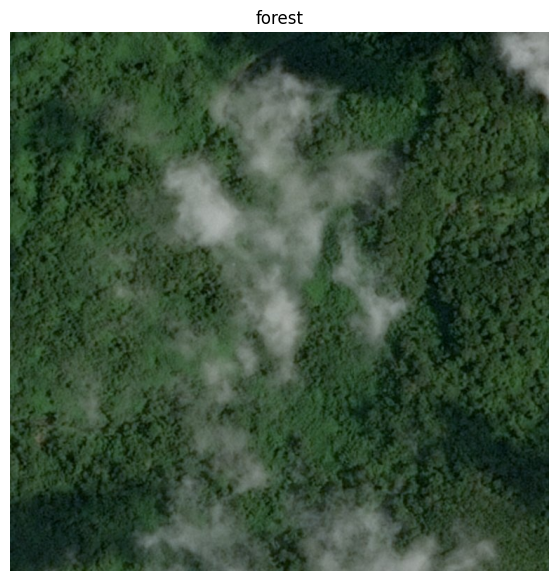

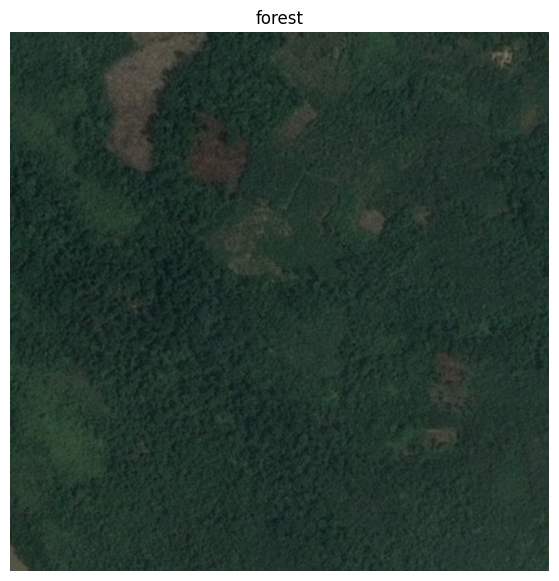

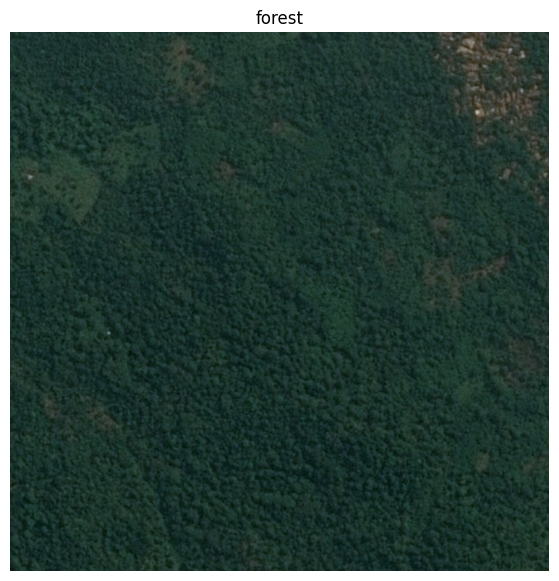

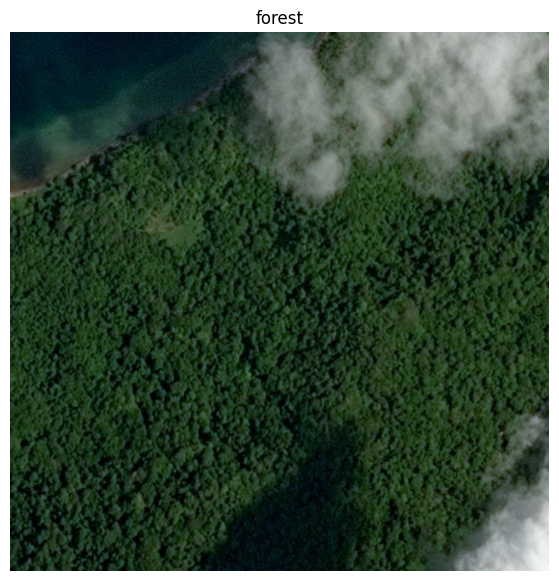

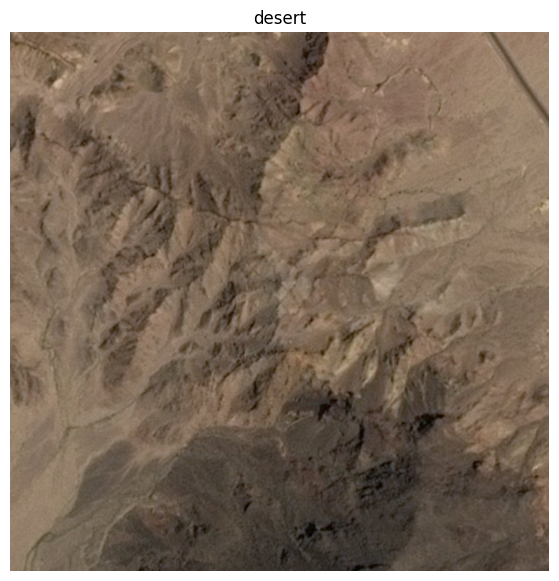

...

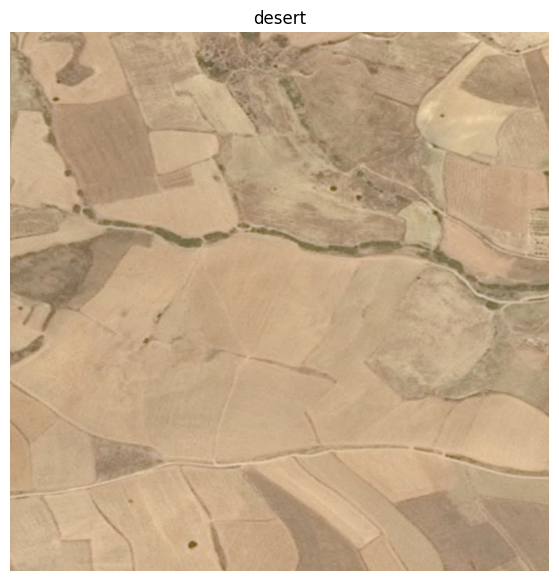

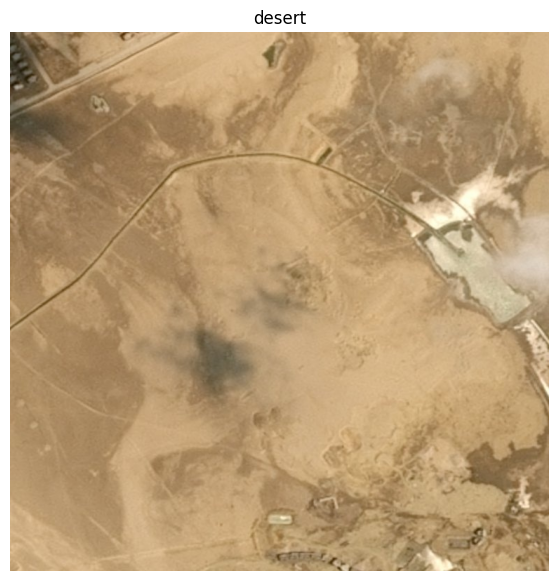

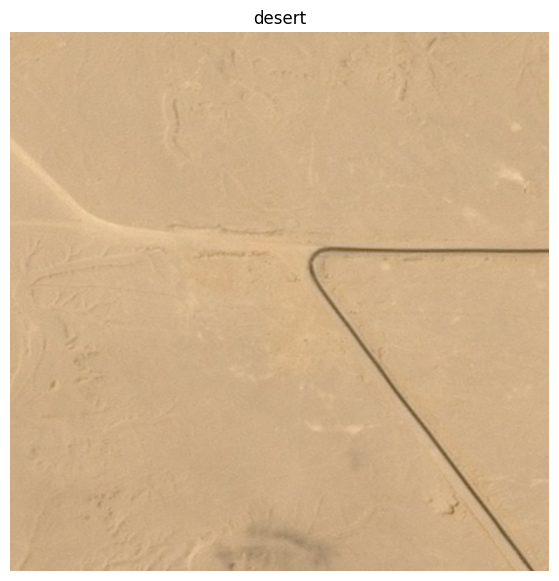

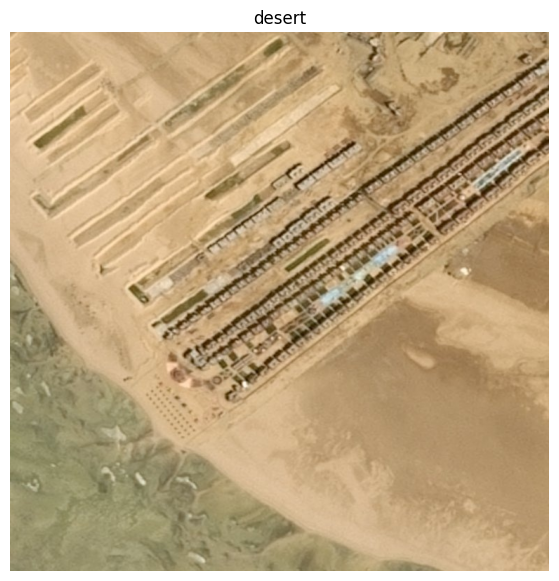

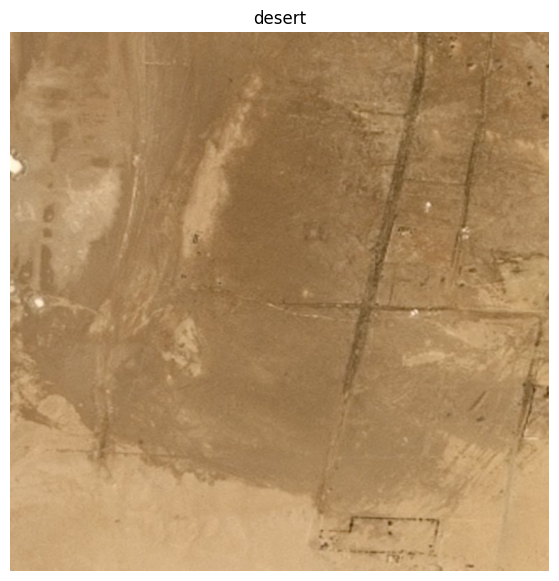

In [22]:
def analyze_image(image_array: np.ndarray) -> bool:
    channel_means = np.mean(image_array, axis=(0, 1))  # Средние значения по всем пикселям для каждого канала
    blue_avg, green_avg, red_avg = channel_means[0], channel_means[1], channel_means[2]
    is_green_dominant = green_avg > max(red_avg, blue_avg)
    
    return is_green_dominant

for index in range(17):
        formatted_index = f"{index:02d}" 
        image_path = f"desert_forest/test_image_{formatted_index}.jpg"
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        analysis_result = analyze_image(img)
        if(analysis_result): 
            plot_one_image(img, "forest")
        else:
            plot_one_image(img, "desert")
        

# Задача №2 - Реализовать Image-blending на основе сшивки по градиентам

Задача - взять фото двух лиц : ваше и друга, с помощью метода Poisson image editing совместить глаза, нос и рот с первого изображения со вторым. Суть в том, что при использовании такого метода границы совмещенного изображения не видны.

Статья, где описан метод  

Patrick Pérez, Michel Gangnet, and Andrew Blake. 2003. Poisson image editing. ACM Trans. Graph. 22, 3 (July 2003), 313–318. https://doi.org/10.1145/882262.882269

Пример такого совмещения:

<img src="../homework/blending/blending.png" alt="Drawing" style="width: 700px;"/>


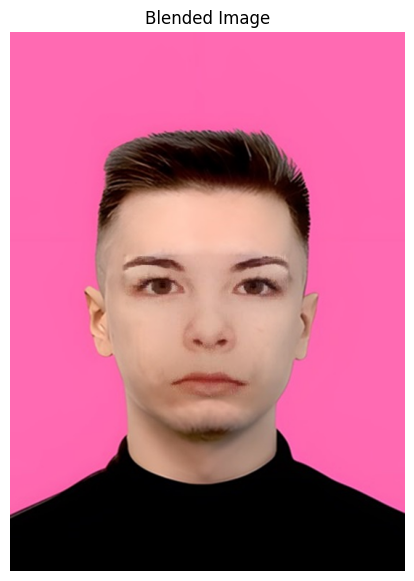

In [50]:
first_human_path = "blending/human_1.jpg"
second_human_path = "blending/human_2.jpg"

first_human = cv2.imread(first_human_path)
second_human = cv2.imread(second_human_path)
first_human = cv2.cvtColor(first_human, cv2.COLOR_RGB2BGR)
second_human = cv2.cvtColor(second_human, cv2.COLOR_RGB2BGR)
# Маска для смешивания
blending_mask = np.zeros(second_human.shape[:2], dtype=np.uint8)
blending_mask[246:332, 149:395] = 255
blending_mask[332:459, 210:341] = 255

# Уменьшим масштаб маски, чтобы лица пропорциональны были
scale_factor = 0.95 
new_size = (int(blending_mask.shape[1] * scale_factor), int(blending_mask.shape[0] * scale_factor))
resized_mask = cv2.resize(blending_mask, new_size, interpolation=cv2.INTER_AREA)

offset_x = int((blending_mask.shape[1] - resized_mask.shape[1]) / 2)
offset_y = int((blending_mask.shape[0] - resized_mask.shape[0]) / 2)
final_mask = np.zeros(second_human.shape[:2], dtype=np.uint8)
final_mask[offset_y:offset_y + resized_mask.shape[0], offset_x:offset_x + resized_mask.shape[1]] = resized_mask

# Выполненяем смешивание изображений с новой маской
blend_center = (270, 405)
result = cv2.seamlessClone(second_human, first_human, final_mask, blend_center, cv2.NORMAL_CLONE)


# Отображение результата смешивания
plot_one_image(result, "Blended Image")


# Задача №3 - Найди клетки

Даны снимки раковых клеток. Существует задача - определить стадию рака клетки по такому изображению. Для того, чтобы подойти к решению классификации рака клетки, необходимо сначала подготовить данные.

Исходные изображения в реальных задачах могут быть очень большого размера (более 20000 px). Однако из визуального анализа можно заметить, что большая часть этих снимков пустая и не несет в себе полезную информацию.

Ваша задача выделить небольшие ячейки изображений из исходного так, чтобы на ячейках было только изображение клетки.

Пример исходного изображения и нарезанных ячеек клетки.
<img src="../img/cell_example.png" alt="Drawing" style="width: 500px;"/>

В качестве аргументов у функции будут значения:
1. исходное изображние;
2. размер ячейки;
3. количество ячеек.

__Доп вопрос__ - как можно выяснить какие нужны значения аргументов, чтобы они подходили для большинства исходных снимков?

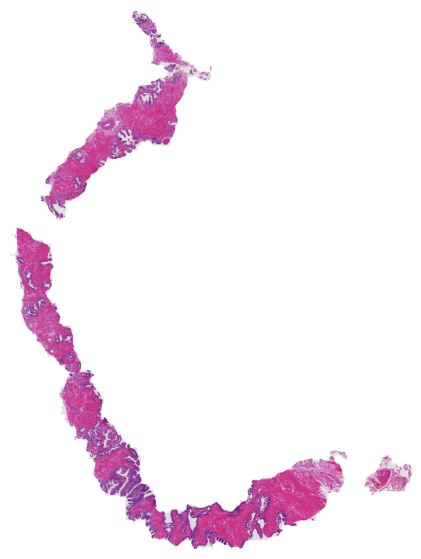

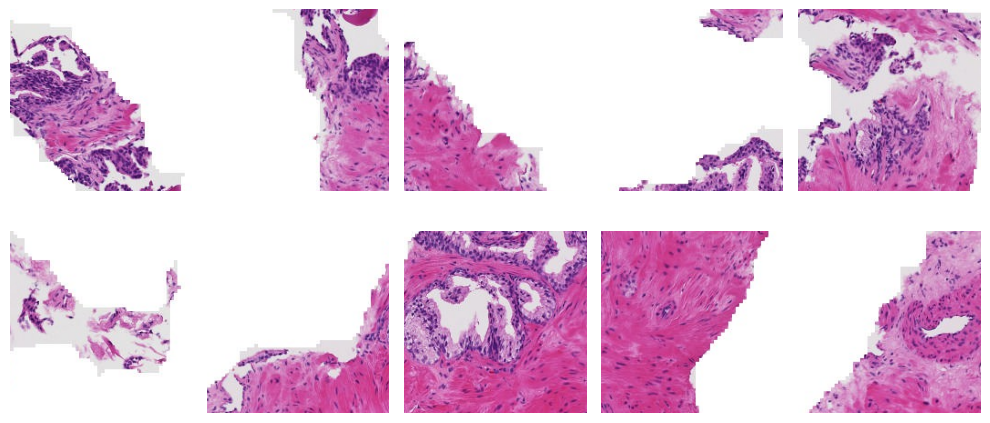

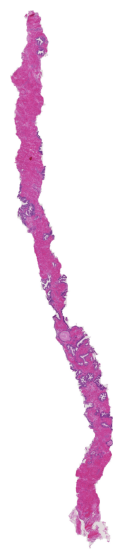

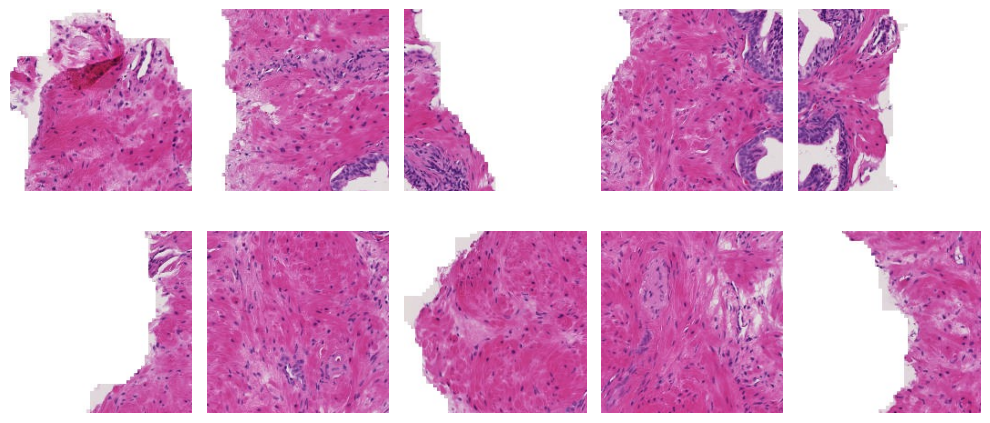

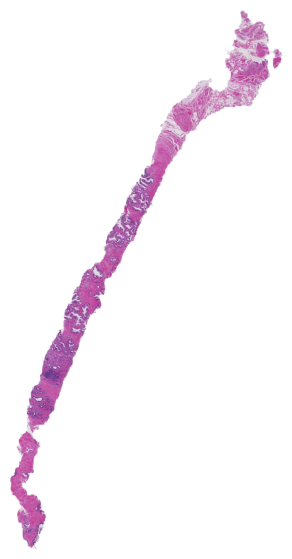

...

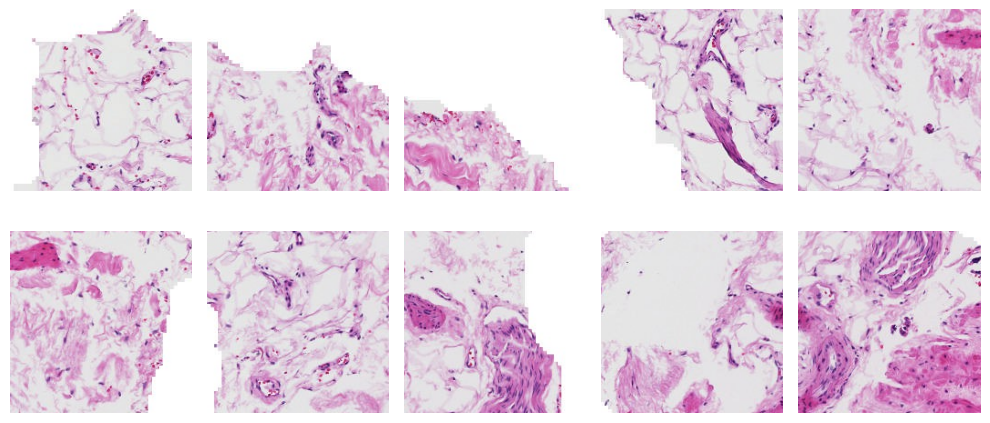

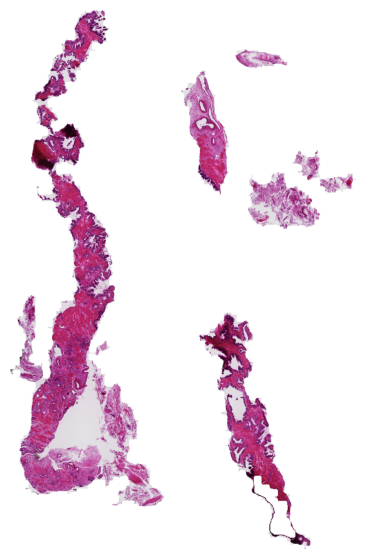

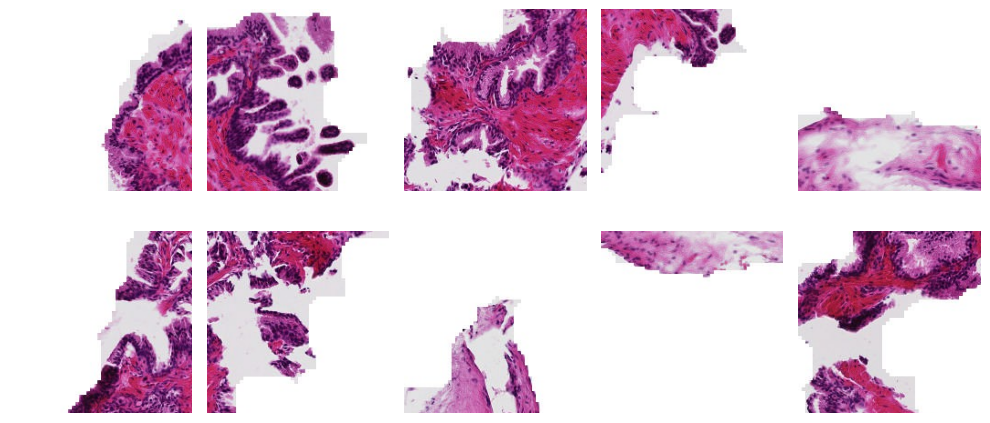

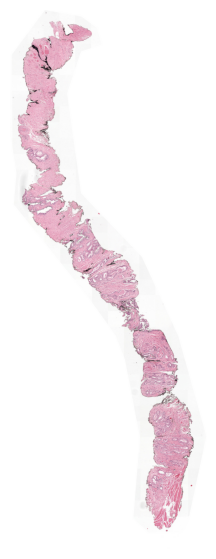

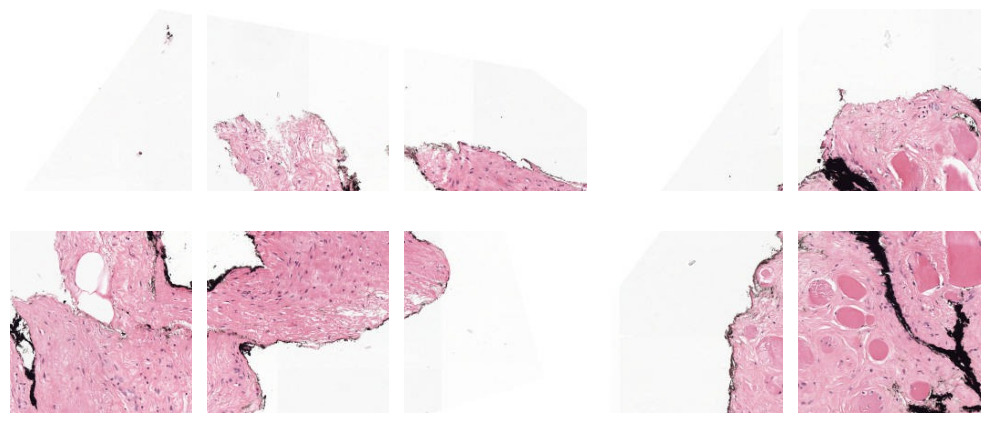

In [59]:
import numpy as np
import matplotlib.pyplot as plt

def detect_regions(image: np.ndarray, block_size: int, max_regions: int) -> list:
    rows, cols = image.shape[:2]
    detected_regions = []

    for y in range(0, rows - block_size + 1, block_size):
        for x in range(0, cols - block_size + 1, block_size):
            block = image[y:y + block_size, x:x + block_size]
            fill_threshold = 0.8 * (block_size * block_size)
            low_fill_channels = sum(np.sum(block[..., i] == 255) < fill_threshold for i in range(3))

            if low_fill_channels > 1:
                detected_regions.append(block)
                if len(detected_regions) >= max_regions:
                    return detected_regions

    return detected_regions

def display_image_grid(images: list, grid_dimensions=(2, 5)) -> None:
    fig, axes = plt.subplots(*grid_dimensions, figsize=(10, 5))
    axes = axes.flatten()

    for idx, ax in enumerate(axes):
        if idx < len(images):
            ax.imshow(images[idx])
            ax.axis('off')
        else:
            continue

    plt.tight_layout()
    plt.show()

for index in range(6):
    image_path = f"cells/train{index}_1.jpeg"
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    plot_one_image(image)
    final_cells = detect_regions(image, 200, 10)
    display_image_grid(final_cells)